In [ ]:
!nvidia-smi

Thu Sep 30 16:10:29 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.63.01    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla K80           Off  | 00000000:00:04.0 Off |                    0 |
| N/A   72C    P0    75W / 149W |      0MiB / 11441MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
!mkdir 'MOBILE_NET_V2'

mkdir: cannot create directory ‘MOBILE_NET_V2’: File exists


In [ ]:
# https://drive.google.com/file/d/1ozoeajKuIRGQ4w5Wv37OR1wpBPODaMS7/view?usp=sharing
!gdown --id 1ozoeajKuIRGQ4w5Wv37OR1wpBPODaMS7
!mkdir './DATASET'
!unzip -u './Garbage-Classification.zip' -d './DATASET/'
!rm -rf '/content/Garbage-Classification.zip'

Downloading...
From: https://drive.google.com/uc?id=1ozoeajKuIRGQ4w5Wv37OR1wpBPODaMS7
To: /content/Garbage-Classification.zip
86.0MB [00:01, 70.6MB/s]
mkdir: cannot create directory ‘./DATASET’: File exists
Archive:  ./Garbage-Classification.zip


In [ ]:
# import some importent library or packages 
import matplotlib.pyplot as plt
import numpy as np
import os
import pathlib
import zipfile
import torch
import torch.nn as nn
import torchvision
import torchvision.transforms as transforms
from torchvision import models
from torch.utils.data import Dataset, DataLoader, ConcatDataset
import torch.optim as optim
import time,sys
import copy
from torch.utils.data import random_split
random_seed = 42
torch.manual_seed(random_seed)

In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [ ]:
DATA_DIR = '/content/DATASET/garbage classification/Garbage classification' 
BATCH_SIZE = 32 ## number of image batch size 
IMAGE_SIZE = 224 ## set image height width to 128x128
NUM_OF_CLASS = 6

In [ ]:
data_dir = DATA_DIR
transform = transforms.Compose([
                                # transforms.ToPILImage(),
                                # transforms.Grayscale(),
                                # transforms.RandomRotation(20,expand=True), ## adding random rotation 20deg
                                # torchvision.transforms.ColorJitter(hue=.05, saturation=.05), ## adding color filter
                                # transforms.RandomVerticalFlip(), ## adding vertical flip
                                # transforms.RandomHorizontalFlip(), ## adding horizontal flip
                                transforms.Resize(IMAGE_SIZE),  ## image resize
                                transforms.CenterCrop(IMAGE_SIZE), ## image center crop
                                transforms.ToTensor(), ## array converted into torch tensor and then divided by 255 (1.0/255)
                                # transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
                               ])
dataset = torchvision.datasets.ImageFolder(data_dir, transform = transform)

train_ds, val_ds = random_split(dataset, [2276, 251])
trainloader = DataLoader(train_ds, BATCH_SIZE, shuffle = True, pin_memory = True)
testloader  = DataLoader(val_ds, BATCH_SIZE, shuffle = True, pin_memory = True)

In [ ]:
def imshow(image, ax=None, title=None, normalize=True):
  if ax is None:
    fig, ax = plt.subplots() 
  image = image.detach().numpy().transpose((1, 2, 0))  ## for converting dimension (3, 128, 128) to (128, 128, 3) 
  if normalize:
    ## this is depends on dataset. This is ImageNet normalization
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    image = std * image + mean
    image = np.clip(image, 0, 1)
  ax.imshow(image)
  return ax

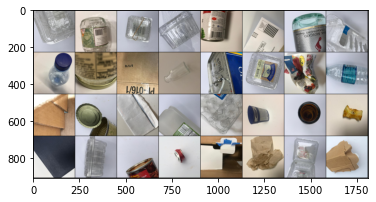

In [ ]:
dataiter = iter(trainloader)
images, labels = dataiter.next()

imshow(torchvision.utils.make_grid(images),normalize=False)

In [ ]:
def set_parameter_requires_grad(model, feature_extracting):
    if feature_extracting:
        for param in model.parameters():
            param.requires_grad = False

In [ ]:
num_classes = NUM_OF_CLASS

model_ft = models.mobilenet_v2(pretrained=True)

# set_parameter_requires_grad(model_ft, True)
num_ftrs = model_ft.classifier[1].in_features
model_ft.fc = nn.Linear(num_ftrs, num_classes)

model_ft = model_ft.to(device)

In [ ]:
model_ft

MobileNetV2(
  (features): Sequential(
    (0): ConvBNActivation(
      (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU6(inplace=True)
    )
    (1): InvertedResidual(
      (conv): Sequential(
        (0): ConvBNActivation(
          (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
          (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): ReLU6(inplace=True)
        )
        (1): Conv2d(32, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (2): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
    )
    (2): InvertedResidual(
      (conv): Sequential(
        (0): ConvBNActivation(
          (0): Conv2d(16, 96, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (1): BatchNorm2d(96, eps=1e-05, momen

In [ ]:
optimizer_ft = optim.Adam(model_ft.parameters(), )
criterion = nn.CrossEntropyLoss()

In [ ]:
def save_model(
               MODEL_USED,
               SAVEPATH,
               epoch, 
               batch_size, 
               model,
               optimizer,
               image_size,
               tranning_loss=[],
               tranning_acc=[],
               validation_loss=[],
               validation_acc=[],
               learning_rate=0.001,
               meta_data=None):
  SAVEPATH += f"{MODEL_USED}-checkpoint-epoch-{epoch}.pt"
  save_obj = {
       'MODEL_USED':MODEL_USED,
       'batch_size':batch_size,
       'epoch': epoch,
       'model_full': model,
       'optimizer_full': optimizer,
       'model_state': model.state_dict(),
       'optimizer_state': optimizer.state_dict(),
       'image_size': image_size,
       'tranning_loss': tranning_loss,
       'tranning_acc': tranning_acc,
       'validation_loss': validation_loss,
       'validation_acc': validation_acc,
       'learning_rate':learning_rate,
       'meta_data':meta_data
       }

  torch.save(save_obj, SAVEPATH)

In [ ]:
def train_model(start, end, 
                model_used ,
                model_save_path, 
                model, 
                criterion, 
                optimizer, 
                dataloaders,
                testloaders , 
                all_tranning_loss=[], all_validation_loss=[], all_tranning_accuracy=[], all_validation_accuracy=[]):
    since = time.time()
    num_epochs = end
    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0
    phase = 'train'
    steps = 0

    for epoch in range(start,num_epochs):
          model.train()
          phase = 'tranning'
          print('Epoch {}/{}'.format(epoch, num_epochs - 1))
          print('-' * 10)
          running_loss = 0.0
          running_corrects = 0

          for i,(inputs, labels) in enumerate(dataloaders):
                
                inputs, labels = inputs.to(device), labels.to(device)

                

                optimizer.zero_grad()

                outputs = model(inputs)
                _, preds = torch.max(outputs, 1)
                loss = criterion(outputs, labels)

                loss.backward()
                optimizer.step()
                

                # running_loss += loss.item() * inputs.size(0)
                running_loss += loss.item()
                running_corrects += torch.sum(preds == labels.data)

                
                

                print_val = f"Epoch: {epoch}/{num_epochs-1} Steps {steps} \t"
                print_val += f"running_loss : {(loss.item()):.6f}\t"
                print_val += f"running_corrects : {torch.sum(preds == labels.data)}\t"  
                print_val += f"total_corrects : {running_corrects}\t"  
                sys.stdout.write('\r' + str(print_val))
                steps += 1
          
          
          steps = 0
          epoch_loss = running_loss / len(dataloaders)
          epoch_acc = running_corrects.double().item() /len(dataloaders.dataset)
          all_tranning_loss.append(loss.item())
          all_tranning_accuracy.append(epoch_acc)
          
          
          print("\n")
          print("----------------------------Tranning Summary----------------------")
          print('{} Tranning Avg. Loss: {:.4f} Tranning Avg. Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_acc))
          print("-"*70)
          print("\n")

          print("Start Validation")
          model.eval()
          with torch.no_grad():
              phase = "validation"
              running_loss = 0.0
              running_corrects = 0
              for i,(inputs, labels) in enumerate(testloaders):
                  inputs, labels = inputs.to(device), labels.to(device)
                  outputs = model(inputs)
                  _, preds = torch.max(outputs, 1)
                  loss = criterion(outputs, labels)
                    
                  running_loss += loss.item()
                  running_corrects += torch.sum(preds == labels.data)  

                  print_val = f"Steps {i} \t"
                  print_val += f"validation_running_loss : {(loss.item()):.6f}\t"
                  print_val += f"validation_running_corrects : {torch.sum(preds == labels.data)}\t"  
                  print_val += f"validation_total_corrects : {running_corrects}\t"  
                  sys.stdout.write('\r' + str(print_val))

              epoch_val_loss = running_loss / len(testloaders)
              epoch_val_acc = running_corrects.double().item() /len(testloaders.dataset)
              all_validation_loss.append(epoch_val_loss)
              all_validation_accuracy.append(epoch_val_acc)

              print()
              print("----------------------------Validation Summary-----------------")
              print('{} Validation Avg. Loss: {:.4f} Validation Avg. Acc: {:.4f}'.format(
                    phase, epoch_val_loss, epoch_val_acc))
              print("------------------------------------------------------------")


          model.train()
          
          print("-------Start Model Save----\n\n")
          save_model(model_used,
                     model_save_path,
                     epoch, 
                     len(dataloaders),
                     model,
                     optimizer,
                     IMAGE_SIZE,
                     tranning_loss=all_tranning_loss,
                     tranning_acc= all_tranning_accuracy,
                     validation_loss=all_validation_loss,
                     validation_acc=all_validation_accuracy,
                     learning_rate=0.001)
          # break
      
    print("Complete Train")
          ## deep copy the model
          # if phase == 'val' and epoch_acc > best_acc:
          #       best_acc = epoch_acc
          #       best_model_wts = copy.deepcopy(model.state_dict())

    print()
    
    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))

    return 

In [ ]:
from pathlib import Path

START=0
model_save_path = './MOBILE_NET_V2/' # must give `/` for the folder directory

model_used= 'RSNET-18'
# model_ft = model_1
model_ft = model_ft
# model_ft = model_2
# model_ft = model_3
optimizer_ft = optimizer_ft
all_tranning_loss = [];
all_validation_loss = [];
all_tranning_accuracy = []; 
all_validation_accuracy = [];

load_saved_model='/content/EXP-1-2/EXPERIMENT_MODEL_1_2-checkpoint-epoch-199.pt'
p = Path(load_saved_model)
if len(load_saved_model) > 1 and p.exists():
  loadedModel = torch.load(load_saved_model, map_location=device)
  model_used = loadedModel['MODEL_USED']
  model_ft =  loadedModel['model_full']
  model_ft.load_state_dict(loadedModel['model_state'])
  optimizer_ft = loadedModel['optimizer_full']
  optimizer_ft.load_state_dict(loadedModel['optimizer_state'] )
  START = loadedModel['epoch'] + 1 
  all_tranning_loss = loadedModel['tranning_loss'] 
  all_validation_loss = loadedModel['validation_loss'] 
  all_tranning_accuracy = loadedModel['tranning_acc'] 
  all_validation_accuracy = loadedModel['validation_acc']

END=20
trainloader= trainloader
testloader = testloader

In [ ]:
train_model(START, END,model_used, model_save_path, model_ft, criterion, optimizer_ft, trainloader, testloader, 
            all_tranning_loss, 
            all_validation_loss, 
            all_tranning_accuracy, 
            all_validation_accuracy)

Epoch 0/19
----------
Epoch: 0/19 Steps 71 	running_loss : 0.474016	running_corrects : 3	total_corrects : 1554	

----------------------------Tranning Summary----------------------
tranning Tranning Avg. Loss: 1.3325 Tranning Avg. Acc: 0.6828
----------------------------------------------------------------------


Start Validation
Steps 71 	validation_running_loss : 0.059441	validation_running_corrects : 4	validation_total_corrects : 1951	
----------------------------Validation Summary-----------------
validation Validation Avg. Loss: 0.3914 Validation Avg. Acc: 0.8572
------------------------------------------------------------
-------Start Model Save----


Epoch 1/19
----------
Epoch: 1/19 Steps 71 	running_loss : 1.713563	running_corrects : 2	total_corrects : 1909	

----------------------------Tranning Summary----------------------
tranning Tranning Avg. Loss: 0.4828 Tranning Avg. Acc: 0.8388
----------------------------------------------------------------------


Start Validation
St

In [ ]:
# from google.colab import drive
# drive.mount('./drive')

Mounted at ./drive


In [ ]:
# !zip -r MOBILE_NET_V2_Model.zip './MOBILE_NET_V2'

updating: MOBILE_NET_V2/ (stored 0%)
  adding: MOBILE_NET_V2/RSNET-18-checkpoint-epoch-8.pt (deflated 9%)
  adding: MOBILE_NET_V2/RSNET-18-checkpoint-epoch-17.pt (deflated 9%)
  adding: MOBILE_NET_V2/RSNET-18-checkpoint-epoch-4.pt (deflated 9%)
  adding: MOBILE_NET_V2/RSNET-18-checkpoint-epoch-11.pt (deflated 9%)
  adding: MOBILE_NET_V2/RSNET-18-checkpoint-epoch-9.pt (deflated 9%)
  adding: MOBILE_NET_V2/RSNET-18-checkpoint-epoch-7.pt (deflated 9%)
  adding: MOBILE_NET_V2/RSNET-18-checkpoint-epoch-13.pt (deflated 9%)
  adding: MOBILE_NET_V2/RSNET-18-checkpoint-epoch-2.pt (deflated 9%)
  adding: MOBILE_NET_V2/RSNET-18-checkpoint-epoch-19.pt (deflated 9%)
  adding: MOBILE_NET_V2/RSNET-18-checkpoint-epoch-10.pt (deflated 9%)
  adding: MOBILE_NET_V2/RSNET-18-checkpoint-epoch-0.pt (deflated 9%)
  adding: MOBILE_NET_V2/RSNET-18-checkpoint-epoch-12.pt (deflated 9%)
  adding: MOBILE_NET_V2/RSNET-18-checkpoint-epoch-5.pt (deflated 9%)
  adding: MOBILE_NET_V2/RSNET-18-checkpoint-epoch-14.pt (def

In [ ]:
# !cp '/content/MOBILE_NET_V2_Model.zip' '/content/drive/Shareddrives/CSE-4238-Project/Training/MobileNetV2/run-1'

In [ ]:
# import some importent library or packages 
import glob,sys,os
import matplotlib.pyplot as plt
import warnings
import numpy as np
import seaborn as sn
import pandas as pd
import pathlib
import zipfile
import torch
import torch.nn as nn
import torchvision
import torchvision.transforms as transforms
from torchvision import models
from torch.utils.data import Dataset, DataLoader, ConcatDataset
import torch.optim as optim
import time,sys
import copy
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

warnings.filterwarnings('ignore')

In [ ]:
MODEL_LOAD_PATH = '/content/MOBILE_NET_V2/RSNET-18-checkpoint-epoch-19.pt'
model = torch.load(MODEL_LOAD_PATH,map_location='cpu')
model['MODEL_USED'] = "MobileNetV2"
model

{'MODEL_USED': 'MobileNetV2',
 'batch_size': 72,
 'epoch': 19,
 'image_size': 224,
 'learning_rate': 0.001,
 'meta_data': None,
 'model_full': MobileNetV2(
   (features): Sequential(
     (0): ConvBNActivation(
       (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
       (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
       (2): ReLU6(inplace=True)
     )
     (1): InvertedResidual(
       (conv): Sequential(
         (0): ConvBNActivation(
           (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
           (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
           (2): ReLU6(inplace=True)
         )
         (1): Conv2d(32, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
         (2): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
       )
     )
     (2): InvertedResidual(
       (conv): Seque

In [ ]:
_tranning_loss = model['tranning_loss']
_tranning_acc = model['tranning_acc']
_validation_loss = model['validation_loss']
_validation_acc = model['validation_acc']

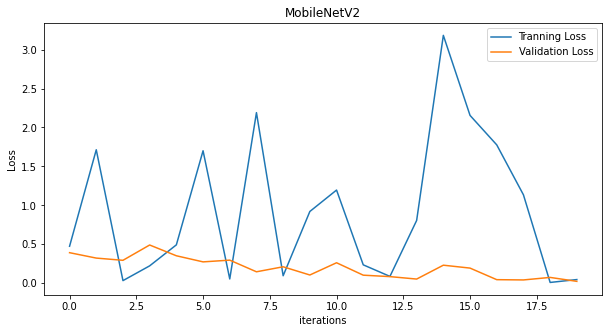

In [ ]:
plt.figure(figsize=(10,5))
plt.title(model['MODEL_USED'])
plt.plot(_tranning_loss,label="Tranning Loss")
plt.plot(_validation_loss,label="Validation Loss")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

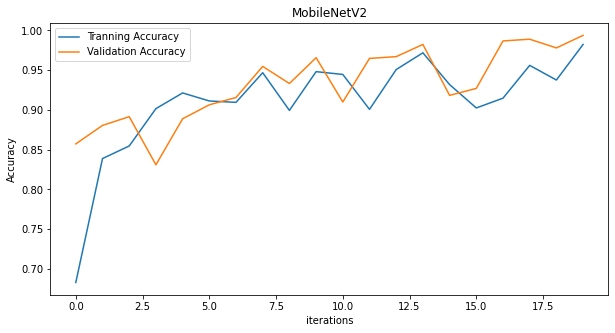

In [ ]:
plt.figure(figsize=(10,5))
plt.title(model['MODEL_USED'])
plt.plot(_tranning_acc,label="Tranning Accuracy")
plt.plot(_validation_acc,label="Validation Accuracy")
plt.xlabel("iterations")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

In [ ]:
preTrainedModel = model['model_full']
preTrainedModel.load_state_dict( model['model_state'])

<All keys matched successfully>

In [ ]:
y_true_tensor = torch.tensor([])
y_pred_tensor = torch.tensor([])
preTrainedModel.eval()
for i,(inputs, labels) in enumerate(testloader):

  # inputs, labels = inputs.to(device), labels.to(device)
  inputs, labels = inputs, labels
  outputs = preTrainedModel(inputs)
  _, preds = torch.max(outputs, 1)
  y_true_tensor = torch.cat((y_true_tensor,labels))
  y_pred_tensor = torch.cat((y_pred_tensor,preds))
  print(i)
  # break


0
1
2
3
4
5
6
7


In [ ]:
y_true = y_true_tensor.tolist()
y_pred = y_pred_tensor.tolist()

In [ ]:
matrice = confusion_matrix(y_true,y_pred)
matrice

array([[42,  0,  0,  0,  0,  0],
       [ 0, 42,  0,  0,  1,  0],
       [ 1,  0, 34,  0,  0,  0],
       [ 0,  0,  0, 62,  0,  0],
       [ 0,  1,  0,  0, 49,  0],
       [ 0,  0,  1,  1,  0, 17]])

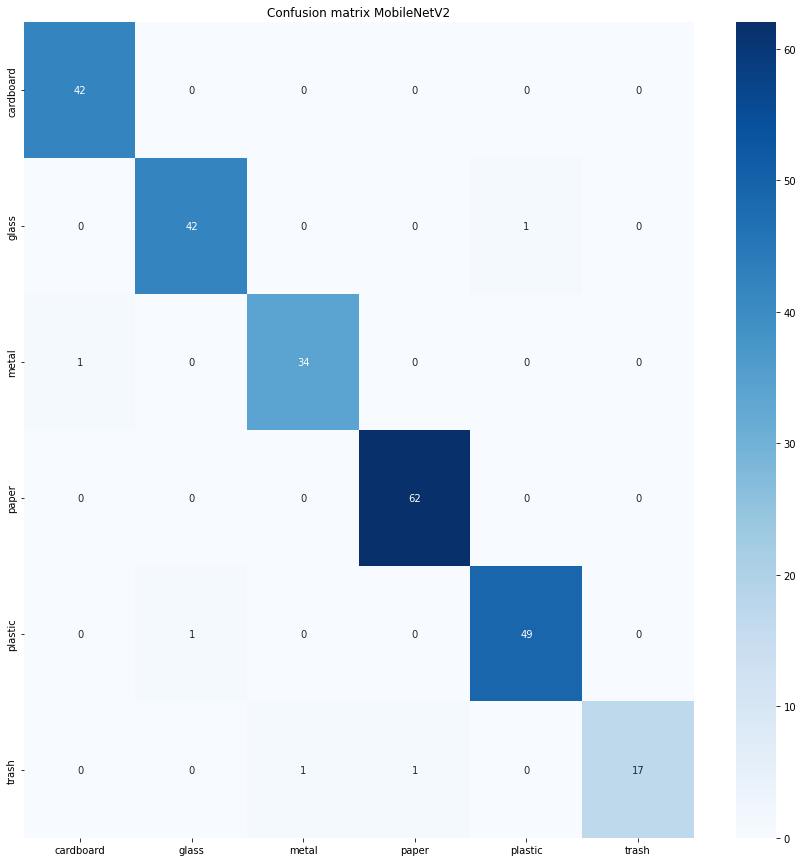

In [ ]:
target_names = list(val_ds.dataset.class_to_idx.keys())
df_cm = pd.DataFrame(matrice,columns=target_names,index=target_names)
plt.figure(figsize=(15,15))
sn.heatmap(df_cm, annot=True,annot_kws={"size": 10},fmt='g',cmap='Blues',)
plt.title(f"Confusion matrix {model['MODEL_USED']}")
plt.savefig('./confusion-matrix-jpg.jpg',pad_inches=0.0,transparent=True)
plt.savefig('./confusion-matrix-png.png',pad_inches=0.0,transparent=True)
plt.show()

In [ ]:
target_names = list(val_ds.dataset.class_to_idx.keys())
classify_report = classification_report(y_true, y_pred, target_names=target_names)
print(classify_report)

              precision    recall  f1-score   support

   cardboard       0.98      1.00      0.99        42
       glass       0.98      0.98      0.98        43
       metal       0.97      0.97      0.97        35
       paper       0.98      1.00      0.99        62
     plastic       0.98      0.98      0.98        50
       trash       1.00      0.89      0.94        19

    accuracy                           0.98       251
   macro avg       0.98      0.97      0.98       251
weighted avg       0.98      0.98      0.98       251



# Test External

In [ ]:
# import some importent library or packages 
import matplotlib.pyplot as plt
import numpy as np
import os
import pathlib
import zipfile
import torch
import torch.nn as nn
import torchvision
import torchvision.transforms as transforms
from torchvision import models
from torch.utils.data import Dataset, DataLoader, ConcatDataset
import torch.optim as optim
import time,sys
import copy
from torch.utils.data import random_split
random_seed = 42
torch.manual_seed(random_seed)

In [ ]:
!gdown --id 1-D_OOio9asMPda0sMeUhpkyuLDtgHQYR
!unzip './MOBILE_NET_V2_Model.zip'

Downloading...
From: https://drive.google.com/uc?id=1-D_OOio9asMPda0sMeUhpkyuLDtgHQYR
To: /content/MOBILE_NET_V2_Model.zip
775MB [00:04, 174MB/s]
Archive:  ./MOBILE_NET_V2_Model.zip
replace MOBILE_NET_V2/RSNET-18-checkpoint-epoch-8.pt? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

In [ ]:
MODEL_LOAD_PATH = '/content/MOBILE_NET_V2/RSNET-18-checkpoint-epoch-19.pt'
model = torch.load(MODEL_LOAD_PATH,map_location='cpu')
model['MODEL_USED'] = "MobileNetV2"
model

{'MODEL_USED': 'MobileNetV2',
 'batch_size': 72,
 'epoch': 19,
 'image_size': 224,
 'learning_rate': 0.001,
 'meta_data': None,
 'model_full': MobileNetV2(
   (features): Sequential(
     (0): ConvBNActivation(
       (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
       (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
       (2): ReLU6(inplace=True)
     )
     (1): InvertedResidual(
       (conv): Sequential(
         (0): ConvBNActivation(
           (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
           (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
           (2): ReLU6(inplace=True)
         )
         (1): Conv2d(32, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
         (2): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
       )
     )
     (2): InvertedResidual(
       (conv): Seque

In [ ]:
import urllib.request


urllib.request.urlretrieve("https://raw.githubusercontent.com/Rafat97/garbage-detection/master/external_image/trash.jpg", "trash.jpg")
urllib.request.urlretrieve("https://raw.githubusercontent.com/Rafat97/garbage-detection/master/external_image/trash2.jpg", "trash2.jpg")

# plastic
urllib.request.urlretrieve("https://raw.githubusercontent.com/Rafat97/garbage-detection/master/external_image/plastic.jpg", "plastic.jpg")
urllib.request.urlretrieve("https://raw.githubusercontent.com/Rafat97/garbage-detection/master/external_image/plastic2.jpg", "plastic2.jpg")


# cardboard
urllib.request.urlretrieve("https://raw.githubusercontent.com/Rafat97/garbage-detection/master/external_image/cardboard.jpg", "cardboard.jpg") 
urllib.request.urlretrieve("https://raw.githubusercontent.com/Rafat97/garbage-detection/master/external_image/cardboard2.jpg", "cardboard2.jpg")      

## cans
urllib.request.urlretrieve("https://raw.githubusercontent.com/Rafat97/garbage-detection/master/external_image/cans.jpg", "cans.jpg") 
urllib.request.urlretrieve("https://raw.githubusercontent.com/Rafat97/garbage-detection/master/external_image/cans2.jpg", "cans2.jpg") 

## glass
urllib.request.urlretrieve("https://raw.githubusercontent.com/Rafat97/garbage-detection/master/external_image/glass.jpg", "glass.jpg")
urllib.request.urlretrieve("https://raw.githubusercontent.com/Rafat97/garbage-detection/master/external_image/glass2.jpg", "glass2.jpg")

## paper
urllib.request.urlretrieve("https://raw.githubusercontent.com/Rafat97/garbage-detection/master/external_image/paper.jpg", "paper.jpg")
urllib.request.urlretrieve("https://raw.githubusercontent.com/Rafat97/garbage-detection/master/external_image/paper2.jpg", "paper2.jpg")

('paper2.jpg', <http.client.HTTPMessage at 0x7f87f6e95790>)

In [ ]:
preTrainedModel = model['model_full']
preTrainedModel.load_state_dict( model['model_state'])

<All keys matched successfully>

torch.return_types.max(
values=tensor([9.0139], grad_fn=<MaxBackward0>),
indices=tensor([5]))
Trash


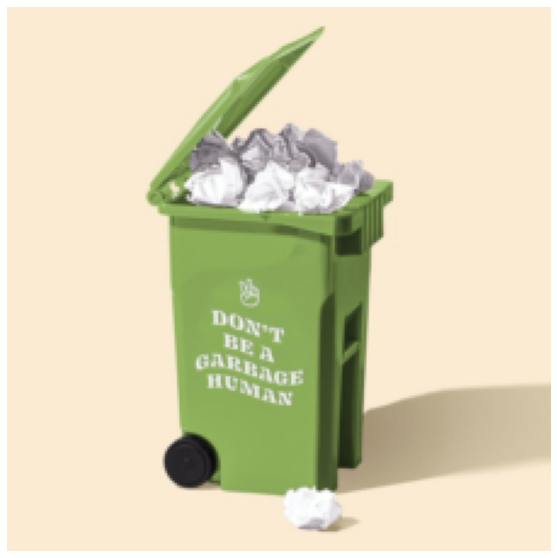

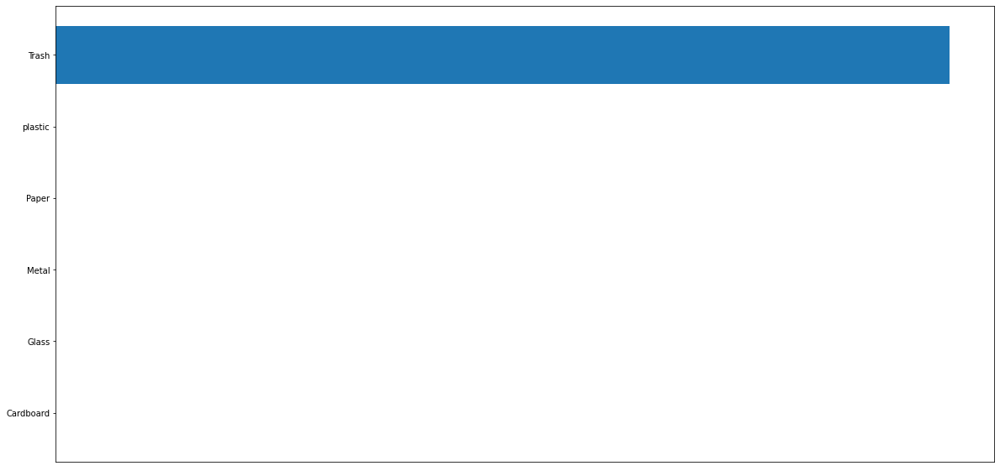

torch.return_types.max(
values=tensor([13.3373], grad_fn=<MaxBackward0>),
indices=tensor([5]))
Trash


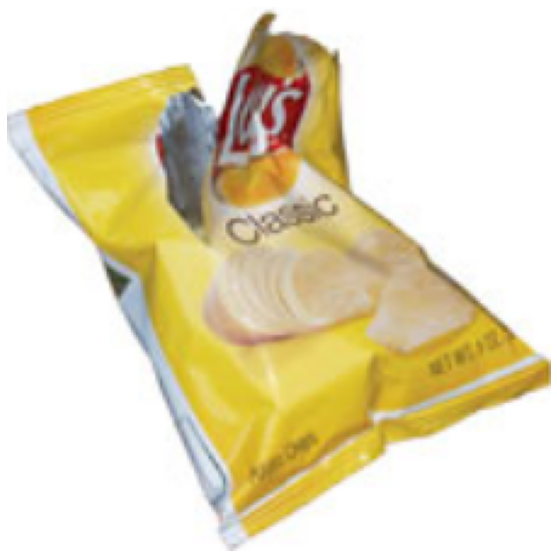

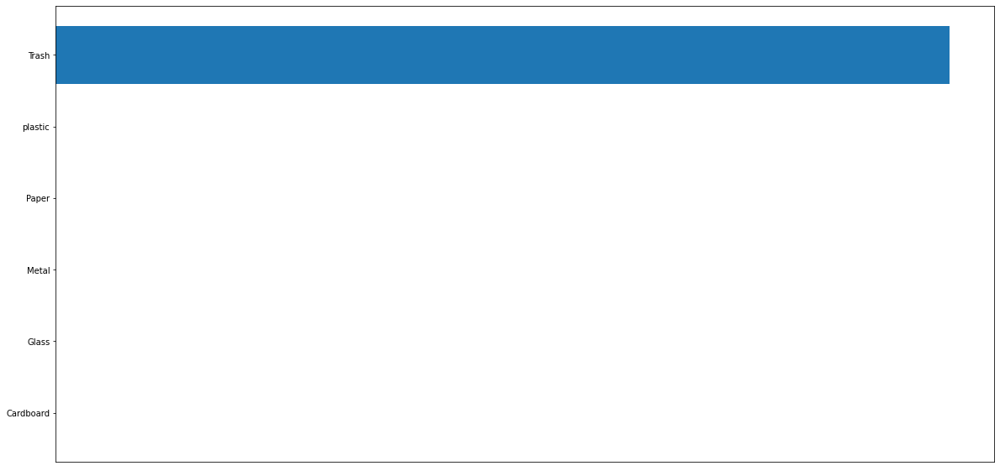

torch.return_types.max(
values=tensor([12.4918], grad_fn=<MaxBackward0>),
indices=tensor([2]))
Metal


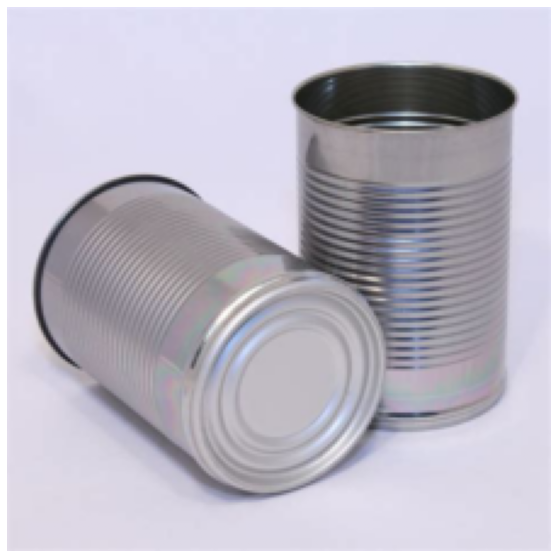

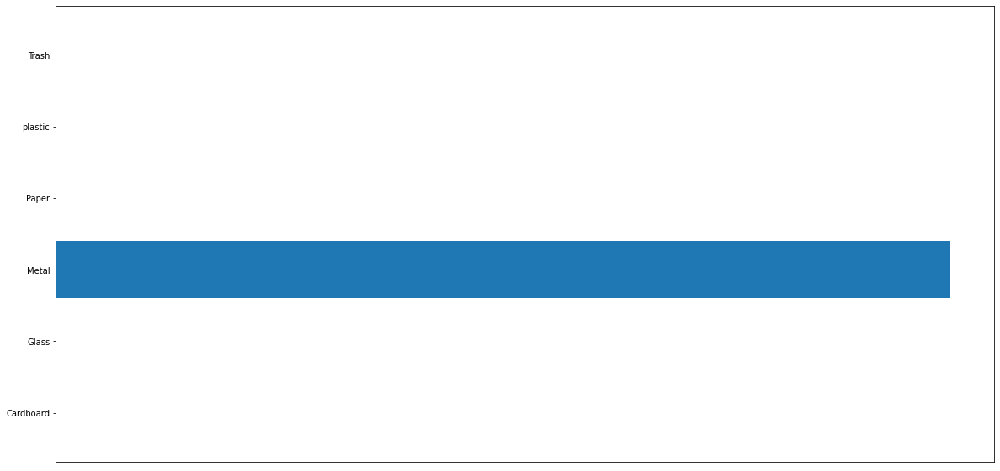

torch.return_types.max(
values=tensor([11.9795], grad_fn=<MaxBackward0>),
indices=tensor([2]))
Metal


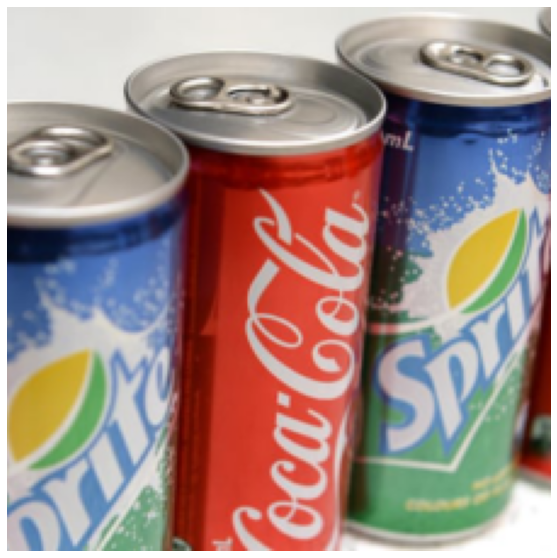

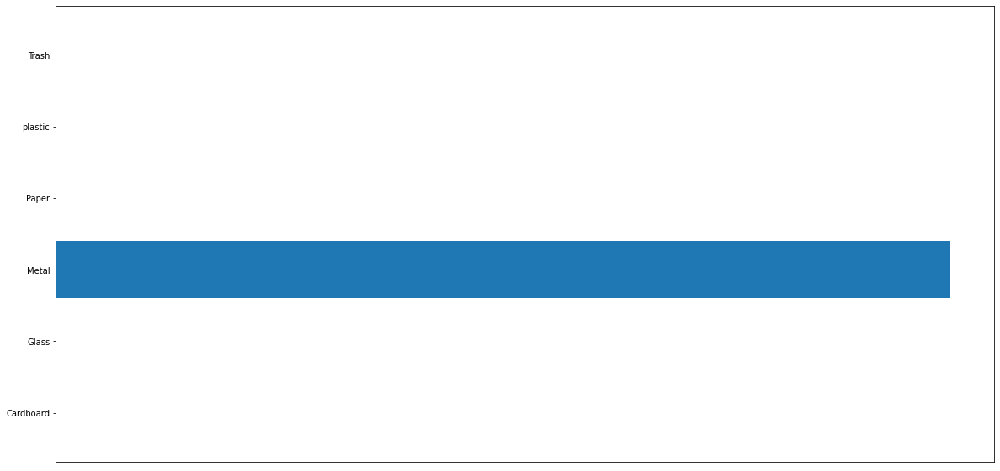

torch.return_types.max(
values=tensor([16.1914], grad_fn=<MaxBackward0>),
indices=tensor([0]))
Cardboard


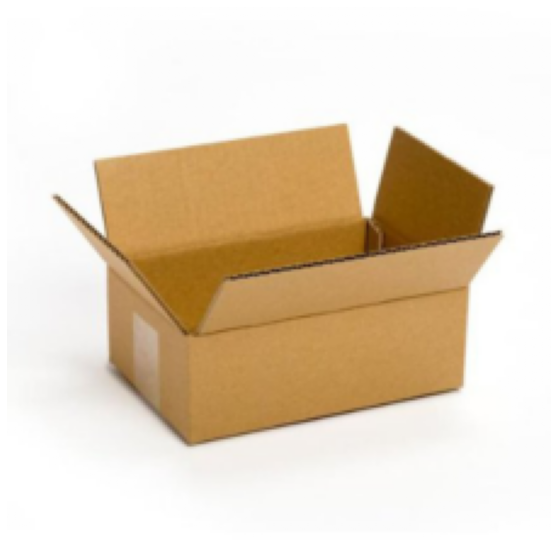

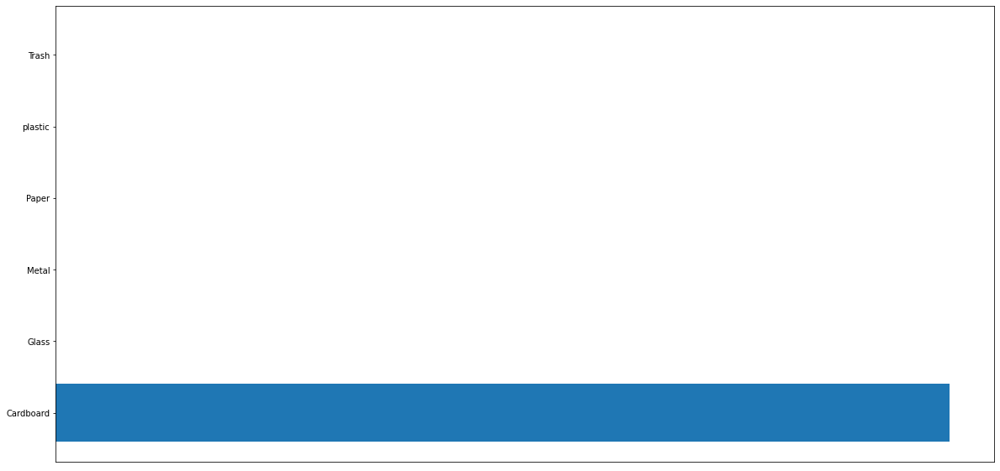

torch.return_types.max(
values=tensor([8.6488], grad_fn=<MaxBackward0>),
indices=tensor([0]))
Cardboard


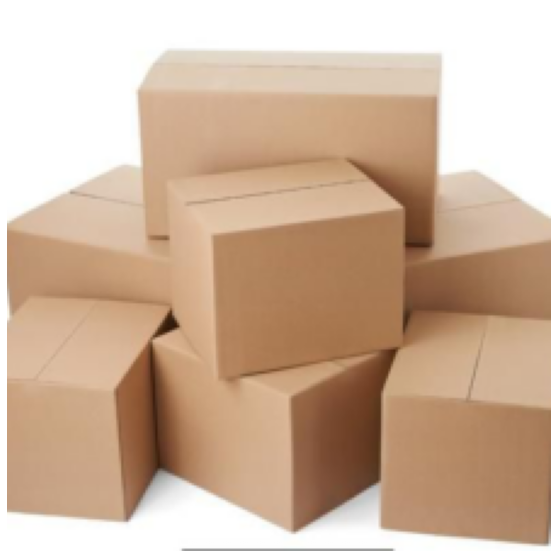

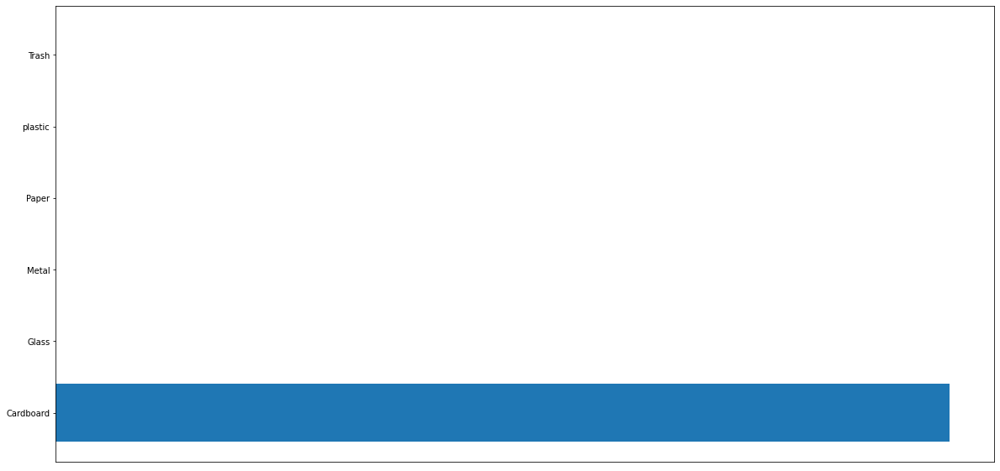

torch.return_types.max(
values=tensor([15.8793], grad_fn=<MaxBackward0>),
indices=tensor([4]))
plastic


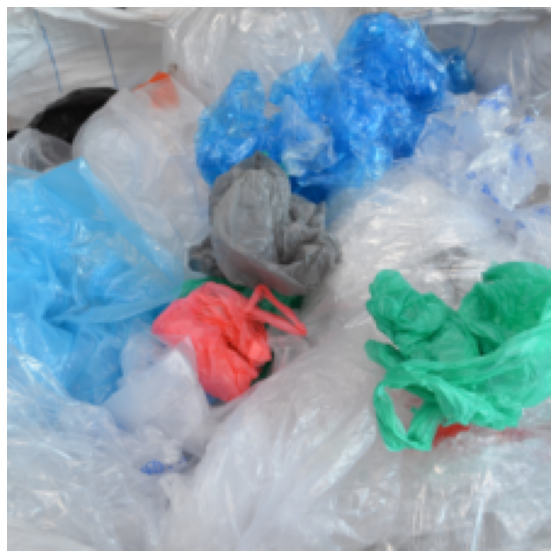

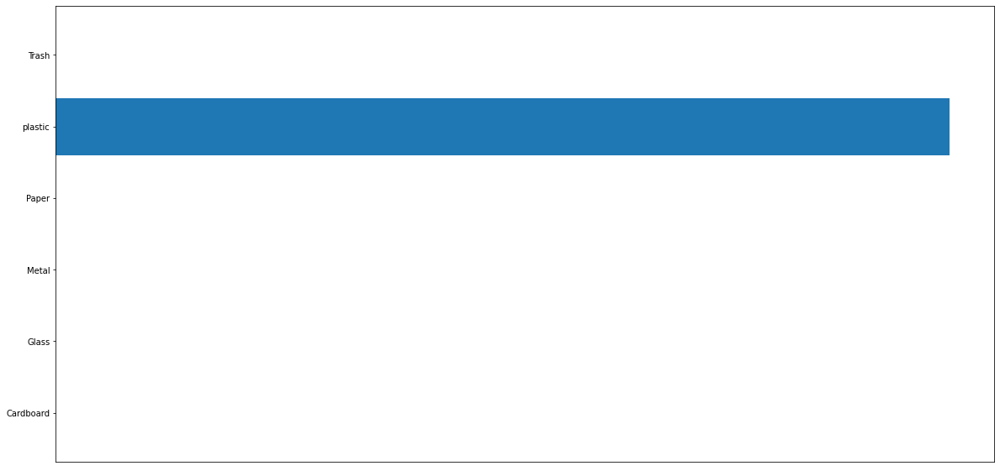

torch.return_types.max(
values=tensor([5.8481], grad_fn=<MaxBackward0>),
indices=tensor([4]))
plastic


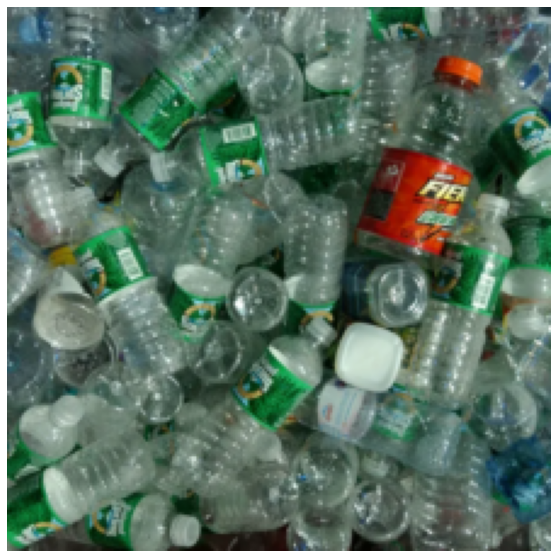

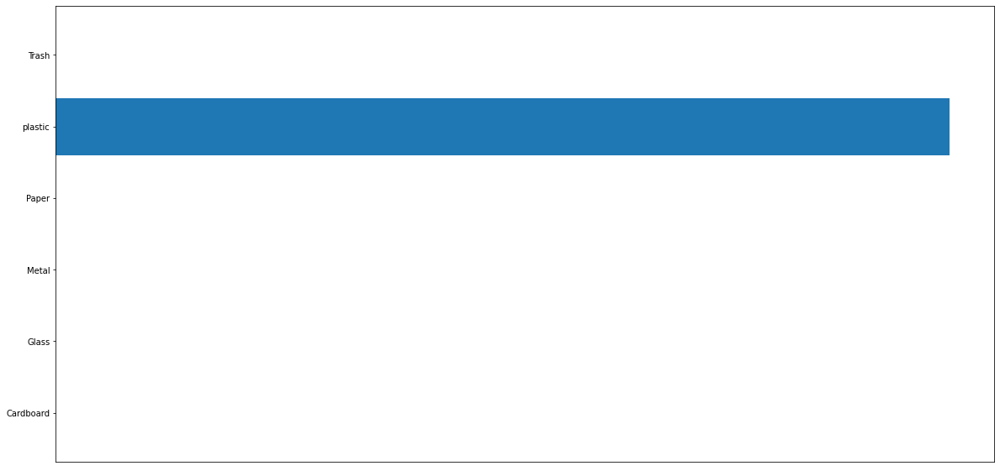

torch.return_types.max(
values=tensor([15.6297], grad_fn=<MaxBackward0>),
indices=tensor([1]))
Glass


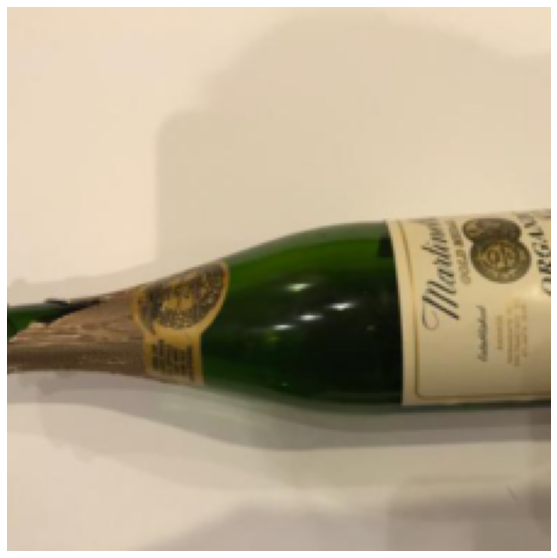

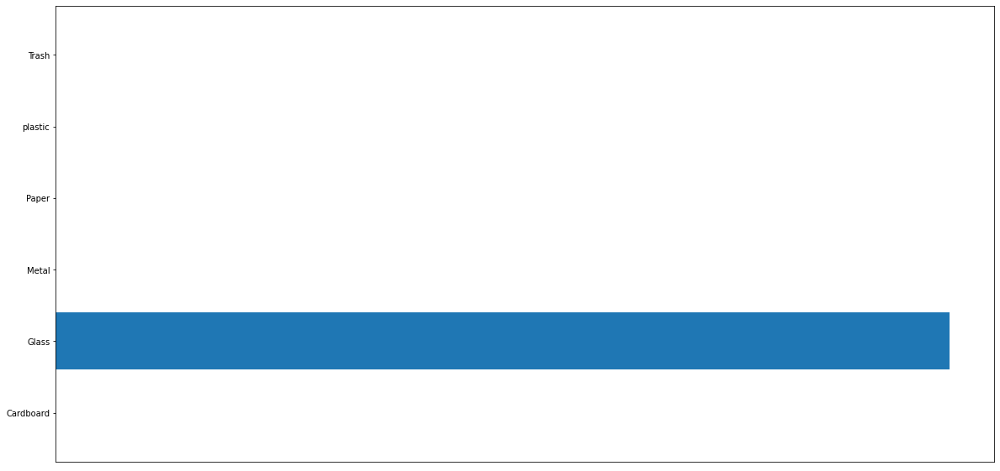

torch.return_types.max(
values=tensor([13.8062], grad_fn=<MaxBackward0>),
indices=tensor([1]))
Glass


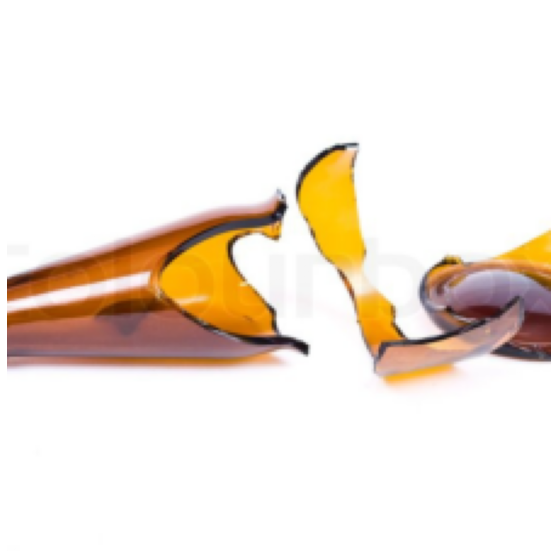

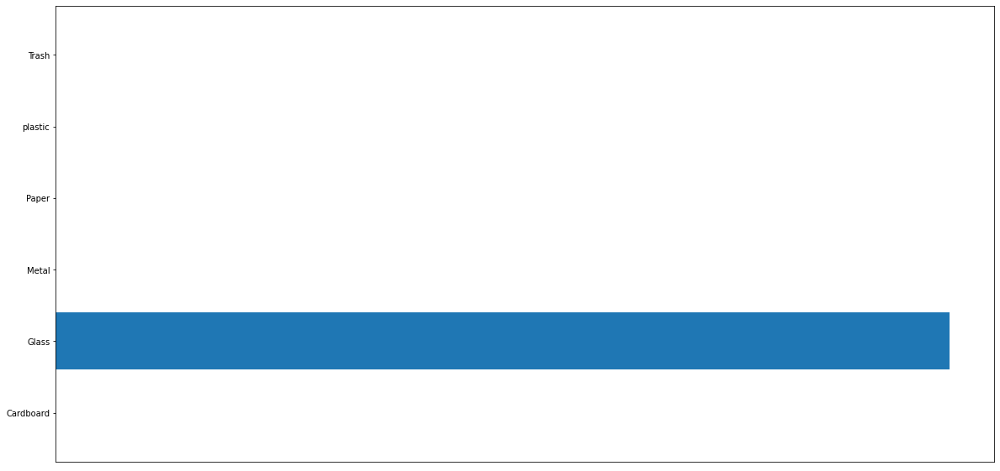

torch.return_types.max(
values=tensor([17.7665], grad_fn=<MaxBackward0>),
indices=tensor([3]))
Paper


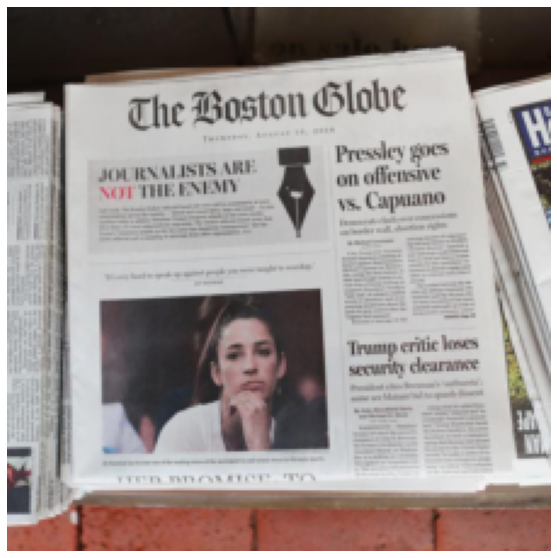

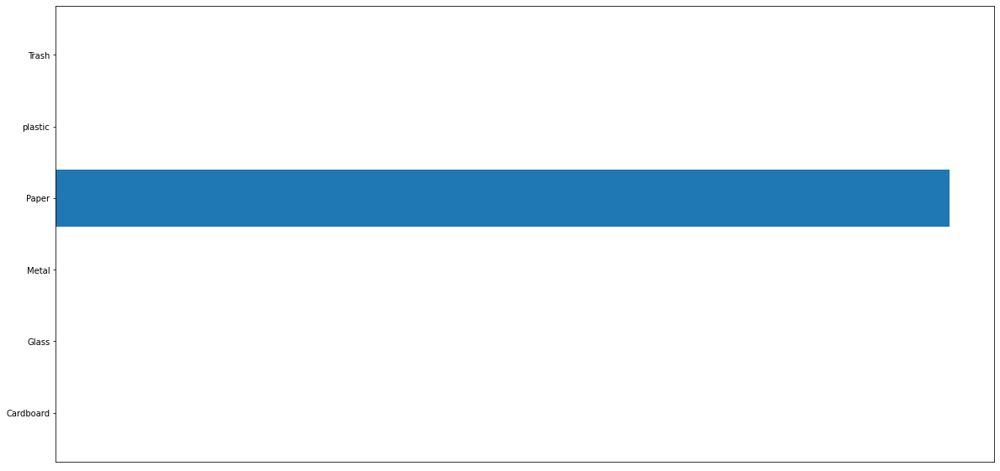

torch.return_types.max(
values=tensor([9.0979], grad_fn=<MaxBackward0>),
indices=tensor([3]))
Paper


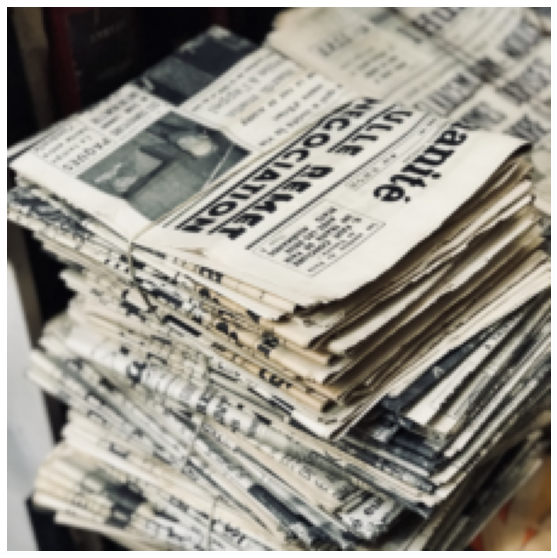

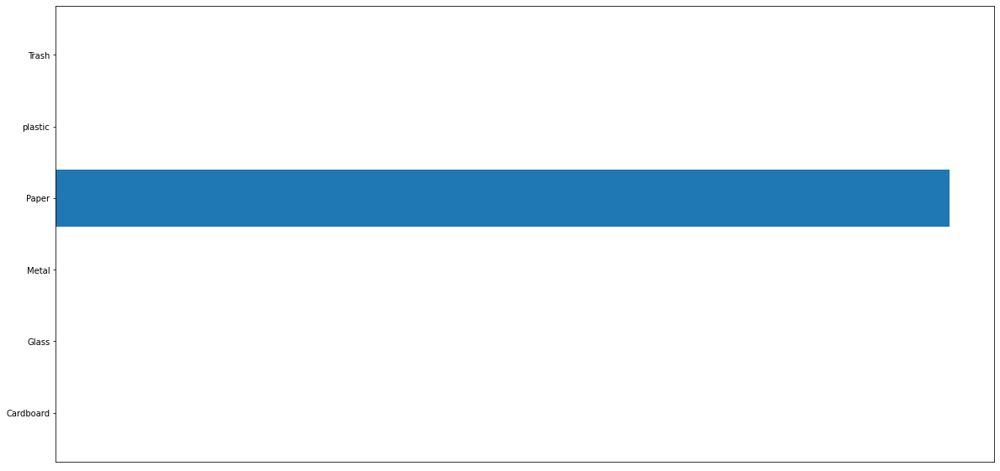

In [ ]:
from PIL import Image
from pathlib import Path

# cardboard     
# glass       
# metal      
# paper       
# plastic      
# trash


def predict_external_image(image_name,model):
    image = Image.open(Path('./' + image_name))
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    IMAGE_SIZE = 224
    classNmae = [
        "Cardboard",
        "Glass",
        "Metal",
        "Paper",
        "plastic",
        "Trash",
    ]
    transform = transforms.Compose([
                                transforms.Resize(IMAGE_SIZE),  
                                transforms.CenterCrop(IMAGE_SIZE),
                                transforms.ToTensor(), 
                               ])
    ex_img = transform(image)
    model.eval()
    inputs = ex_img.unsqueeze(0).to(device)
    outputs = model(inputs)
    _, preds = torch.max(outputs, 1)
    print(torch.max(outputs,1))

    print(classNmae[preds])
    plt.figure(figsize=(10,10))
    plt.imshow(ex_img.permute(1, 2, 0))
    # plt.title("Input Image")
    plt.axis("off")
    plt.show()
    x = np.array(classNmae)
    y = np.zeros(len(classNmae))
    y[preds] = 1
    plt.figure(figsize=(20,10))
    plt.barh(x,y,height=0.8)
    plt.xticks([])
    plt.show()



predict_external_image("trash.jpg",preTrainedModel)
predict_external_image("trash2.jpg",preTrainedModel)
predict_external_image("cans.jpg",preTrainedModel)
predict_external_image("cans2.jpg",preTrainedModel)
predict_external_image("cardboard.jpg",preTrainedModel)
predict_external_image("cardboard2.jpg",preTrainedModel)
predict_external_image("plastic.jpg",preTrainedModel)
predict_external_image("plastic2.jpg",preTrainedModel)
predict_external_image("glass.jpg",preTrainedModel)
predict_external_image("glass2.jpg",preTrainedModel)
predict_external_image("paper.jpg",preTrainedModel)
predict_external_image("paper2.jpg",preTrainedModel)